<a href="https://colab.research.google.com/github/mahn0-0sh/DP-HW1/blob/main/Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


<br>
<font face="Times New Roman">
<div dir=ltr align=center>
<font color=0F5298 size=7>
Digital Image Processing <br>
<font color=2565AE size=5>
Department Of Mathematical Sciences <br>
Spring 2025<br>
<font color=3C99D size=5>
Course Project <br>
</div>


---



**Members:**

 Mahnoosh Azimian 400109402

 Leili Motahari 99171214

 MohammadReza Zia 400108871

In [ ]:
import numpy as np
import cv2

## Section 1: Finding the Objects

In this part, we are going to implement functions to find and indicate samples of `template.png` in `input.jpg`. We will use correlation based methods to achieve this. You can see chapter 13.3 of the course reference for more information on how to do this. As a brief summary, there are four methods you can consider:


1.   **Cross Correlation**
2.   **Zero-mean Cross Correlation**
3.  **Sum of Squared Differences (SSD)**
4.  **Normalized Cross Correlation**

You are free to use any of the above methods (or a combination of them) you prefer (it is recommended to use Normalized Cross Correlation).



In [ ]:
def vertical_boxes(boxes, max_center_dx=30):
    if not boxes:
        return []
    boxes = sorted(boxes, key=lambda b: b[1])
    merged, used = [], [False]*len(boxes)
    for i,(x1,y1,w1,h1) in enumerate(boxes):
        if used[i]: continue
        group = [(x1,y1,w1,h1)]
        cx1 = x1 + w1//2; used[i]=True
        for j in range(i+1,len(boxes)):
            if used[j]: continue
            x2,y2,w2,h2 = boxes[j]
            cx2 = x2 + w2//2
            if abs(cx2-cx1)<=max_center_dx:
                group.append((x2,y2,w2,h2))
                used[j]=True
        xs = [b[0] for b in group]; ys = [b[1] for b in group]
        xe = [b[0]+b[2] for b in group]; ye = [b[1]+b[3] for b in group]
        merged.append((min(xs), min(ys), max(xe)-min(xs), max(ye)-min(ys)))
    return merged

def find_poles_mask(img_bgr, tpl_bgr,
                    scale_range=(0.2,5.8),
                    num_scales=100,
                    match_thresh=0.4,
                    nms_thresh=0.1,
                    score_thresh=0.3,
                    max_center_dx=15):

    gray     = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    tpl_gray = cv2.cvtColor(tpl_bgr, cv2.COLOR_BGR2GRAY)
    tH, tW   = tpl_gray.shape[:2]
    H, W     = gray.shape

    rects, scores = [], []
    for scale in np.linspace(scale_range[0], scale_range[1], num_scales)[::-1]:
        w = int(tW*scale); h = int(tH*scale)
        if w<10 or h<10 or w>W or h>H: continue
        tpl = cv2.resize(tpl_gray, (w,h))
        res = cv2.matchTemplate(gray, tpl, cv2.TM_CCOEFF_NORMED)
        ys, xs = np.where(res>=match_thresh)
        for (y,x) in zip(ys,xs):
            rects.append([x,y,w,h])
            scores.append(float(res[y,x]))
    if not rects:
        return np.zeros_like(gray, dtype=np.uint8)

    idxs = cv2.dnn.NMSBoxes(rects, scores, score_thresh, nms_thresh)
    final = []
    if len(idxs)>0:
        for i in idxs.flatten():
            final.append(tuple(rects[i]))

    merged = vertical_boxes(final, max_center_dx)


    mask = np.zeros_like(gray, dtype=np.uint8)
    for (x,y,w,h) in merged:
            y_new = max(0, y - 30)
            h_new = h + 30
            cv2.rectangle(mask, (x,y_new), (x+w, y_new+h_new), 255, -1)
    return mask



Next function should draw a rectangle around the matches. Input is a masked image which is generated by the above function, indicating the matches.

In [ ]:
def draw_boxes(img_bgr, mask):

    contours,_ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    out = img_bgr.copy()
    boxes = []
    for cnt in contours:
        x, y, w, h = cv2.boundingRect(cnt)
        if w*h > 200:
            y_new = max(0, y - 10)
            h_new = h + 10
            boxes.append((x, y_new, w, h_new))
            cv2.rectangle(out, (x, y_new), (x + w, y_new+h_new), (0, 255, 0), 2)


    try:
        from google.colab.patches import cv2_imshow
        cv2_imshow(out)
    except ImportError:
        cv2.imshow("Detected Poles", out)
        cv2.waitKey(0)
        cv2.destroyAllWindows()


    cv2.imwrite("output1.jpg", out)
    return boxes, out

Now execute above functions for `input.jpg` and find matches for `temple.png`. Indicate the matches by drawing a rectangle around them and save the resulting image as `output1.jpg`. Your score for this part depends on the number of correct and incorrect matches.

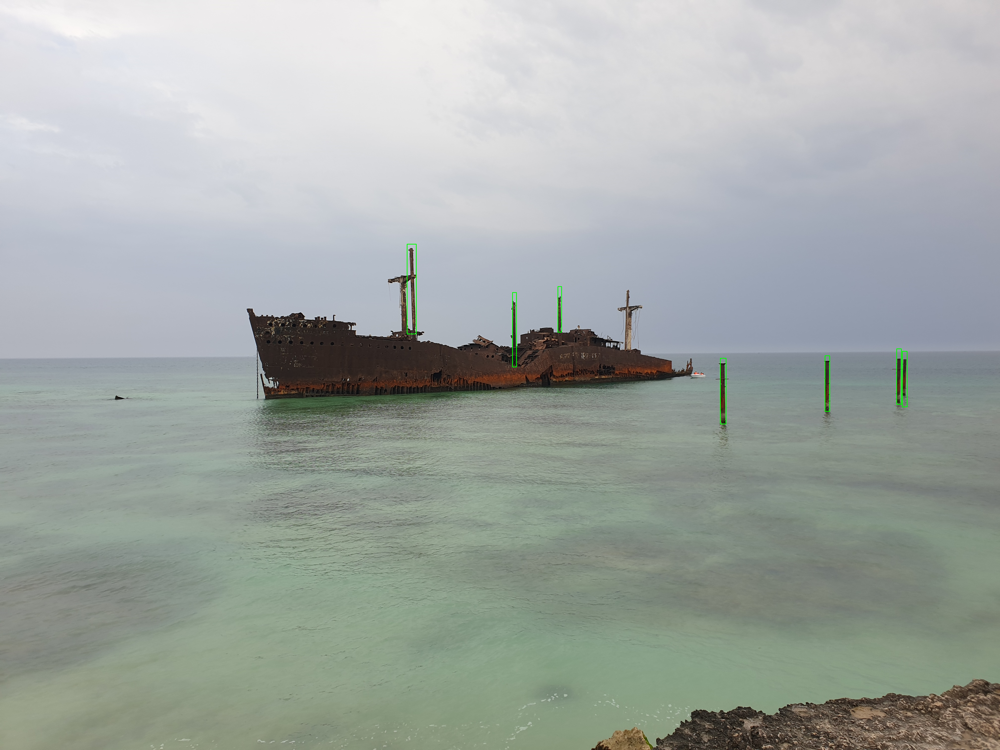

Final boxes (x,y,w,h): [(2904, 1444, 23, 265), (3326, 1434, 19, 224), (3638, 1416, 19, 224), (3615, 1406, 19, 224), (2066, 1179, 16, 300), (2249, 1155, 15, 184), (1641, 984, 37, 362)]


In [ ]:
img = cv2.imread('input.jpg')
tpl = cv2.imread('template_cropped.jpg')


mask = find_poles_mask(
    img, tpl,
    scale_range=(0.2,5.8),
    num_scales=100,
    match_thresh=0.4,
    nms_thresh=0.1,
    score_thresh=0.3,
    max_center_dx=15
)
cv2.imwrite('mask.png', mask)

boxes, vis = draw_boxes(img, mask)
print("Final boxes (x,y,w,h):", boxes)


## Section 2: Image Completion

We will study and implement two methods for image completion.

### Method 1: Texture Synthesis

One way to complete a removed part of an image is to try regenerating the texture of its near pixels to cover it using texture synthesis. Texture synthesis is the process of constructing a large digital image from a small digital sample image by taking advantage of its structural content.

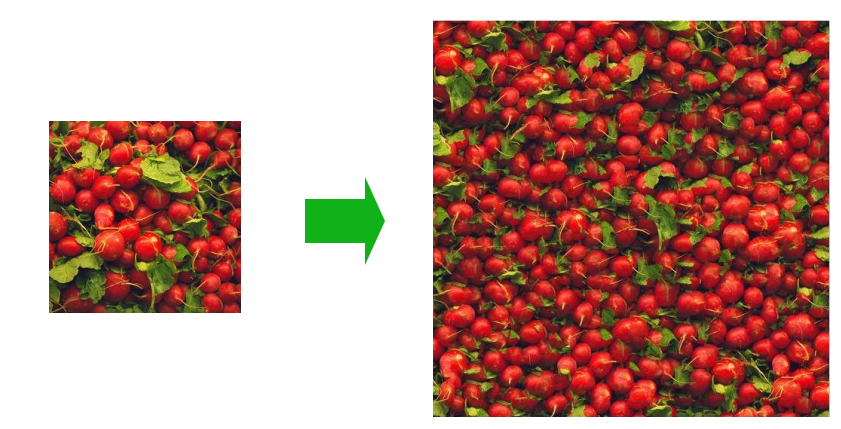

The method we are going to implement is based on the following paper:

 https://people.eecs.berkeley.edu/~efros/research/quilting/quilting.pdf

Complete the following function to apply texture synthesis to generate a larger image (with shape `result_shape`) with the given texture. `patch_size` indicated the size of the patch covered in each iteration. `overlap` is an integer indicating the number of overlaping pixels between any two patches.

**Note:** To avoid complicating this function, you may need to implement other helper functions and use them. implement them in the next cell.


In [ ]:
import torch
import torch.nn.functional as F
from PIL import Image
import numpy as np
from tqdm.notebook import tqdm
import cv2
import logging

BATCH_SIZE = 15
GPU_MEMORY_THRESHOLD = 100 * 1024 * 1024

def load_image(image_path, device):
  img = Image.open(image_path).convert('RGB')
  img = np.array(img).astype(np.float32) / 255.0
  img_tensor = torch.from_numpy(img).permute(2, 0, 1).unsqueeze(0).to(device)
  return img_tensor

def compute_ssd_batch(patches, target, mask=None):
  dtype = torch.float16 if patches.device.type == 'cuda' else torch.float32
  patches = patches.to(dtype)
  target = target.to(dtype)
  diff = patches - target
  if mask is not None:
      diff = diff * mask.to(dtype)
  return torch.sum(diff ** 2, dim=(1, 2, 3)).to(torch.float32)

def get_random_patches(source, patch_size, num_patches, device):
  _, _, h, w = source.shape
  i = torch.randint(0, h - patch_size + 1, (num_patches,), device=device)
  j = torch.randint(0, w - patch_size + 1, (num_patches,), device=device)
  patches = torch.empty((num_patches, 3, patch_size, patch_size), device=device, dtype=torch.float32)
  for k in range(num_patches):
      patches[k] = source[0, :, i[k]:i[k]+patch_size, j[k]:j[k]+patch_size]
  return patches, i, j

def get_coherence_patch(source, patch_size, base_i, base_j, offset_i, offset_j):
  new_i = base_i + offset_i
  new_j = base_j + offset_j
  if new_i < 0 or new_i + patch_size > source.shape[2] or new_j < 0 or new_j + patch_size > source.shape[3]:
      return None, None, None
  patch = source[0, :, new_i:new_i+patch_size, new_j:new_j+patch_size]
  return patch, new_i, new_j

def minimum_error_boundary_cut(overlap_region, direction='horizontal', neighbor_width=2):
  error = torch.sum((overlap_region[0] - overlap_region[1]) ** 2, dim=0)
  if direction != 'horizontal':
      error = error.t()

  h, w = error.shape
  dp = error.clone()
  path = torch.zeros(h, dtype=torch.int64, device=error.device)

  for i in range(1, h):
      prev_row = dp[i-1]
      for j in range(w):
          prev_j = max(0, j - neighbor_width)
          prev_j_end = min(w, j + neighbor_width + 1)
          dp[i, j] += torch.min(prev_row[prev_j:prev_j_end])

  path[-1] = torch.argmin(dp[-1])
  for i in range(h-2, -1, -1):
      j = path[i+1].item()
      prev_j = max(0, j - neighbor_width)
      prev_j_end = min(w, j + neighbor_width + 1)
      path[i] = torch.argmin(dp[i, prev_j:prev_j_end]) + prev_j

  return path

def graph_cut_blend(best_patch, left_overlap, top_overlap, overlap, device):
    if left_overlap is None and top_overlap is None:
        return best_patch

    best_patch = best_patch.to(device)
    mask_left = torch.linspace(1, 0, overlap, device=device).view(1, 1, overlap).expand(3, -1, -1)
    mask_top = torch.linspace(1, 0, overlap, device=device).view(1, overlap, 1).expand(3, -1, -1)

    if left_overlap is not None:
        left_overlap = left_overlap.squeeze(0).to(device)
        if left_overlap.shape[1:] != (best_patch.shape[1], overlap):
            raise ValueError(f"Shape mismatch: left_overlap {left_overlap.shape} vs expected [3, {best_patch.shape[1]}, {overlap}]")
        best_patch[:, :, :overlap] = (best_patch[:, :, :overlap] * (1 - mask_left) +
                                      left_overlap[:, :, :overlap] * mask_left)

    if top_overlap is not None:
        top_overlap = top_overlap.squeeze(0).to(device)
        if top_overlap.shape[1:] != (overlap, best_patch.shape[2]):
            raise ValueError(f"Shape mismatch: top_overlap {top_overlap.shape} vs expected [3, {overlap}, {best_patch.shape[2]}]")
        best_patch[:, :overlap, :] = (best_patch[:, :overlap, :] * (1 - mask_top) +
                                      top_overlap[:, :overlap, :] * mask_top)

    if left_overlap is not None and top_overlap is not None:
        corner = (best_patch[:, :overlap, :overlap] +
                  left_overlap[:, :overlap, :overlap] +
                  top_overlap[:, :overlap, :overlap]) / 3
        best_patch[:, :overlap, :overlap] = corner

    return best_patch

def get_gaussian_kernel2d(kernel_size, sigma, device):
  k = torch.arange(-kernel_size // 2 + 1, kernel_size // 2 + 1, dtype=torch.float32, device=device)
  g = torch.exp(- (k ** 2) / (2 * sigma ** 2))
  g = g / g.sum()
  kernel = g.unsqueeze(1) * g.unsqueeze(0)
  kernel = kernel.view(1, 1, kernel_size, kernel_size).repeat(3, 1, 1, 1)
  return kernel

def create_mask(path, patch_size, overlap, direction='horizontal', feather_sigma=1.5, device='cpu'):
  mask = torch.ones((3, patch_size, patch_size), device=device)
  if direction == 'horizontal':
      for row in range(min(patch_size, len(path))):
          mask[:, row, :path[row].item()] = 0
  else:
      for col in range(min(patch_size, len(path))):
          mask[:, :path[col].item(), col] = 0

  if feather_sigma > 0:
      kernel_size = int(2 * feather_sigma) * 2 + 1
      kernel = get_gaussian_kernel2d(kernel_size, feather_sigma, device)
      mask = mask.unsqueeze(0)
      mask = F.conv2d(mask, kernel, padding=kernel_size//2, groups=3)
      mask = torch.clamp(mask, 0, 1).squeeze(0)

  return mask

def check_gpu_available(threshold=GPU_MEMORY_THRESHOLD):
  if not torch.cuda.is_available():
      return False
  free_memory, _ = torch.cuda.mem_get_info()
  return free_memory > threshold

def move_tensors_to_device(source, output, source_positions, new_device):
  source = source.to(new_device)
  output = output.to(new_device)
  source_positions = source_positions.to(new_device)
  return source, output, source_positions

def fill_unfilled_regions(output, source, patch_size, overlap, device):
  _, _, h, w = output.shape
  step = patch_size - overlap
  num_patches = (h - overlap) // step + 1

  for row in range(num_patches):
      for col in range(num_patches):
          y = min(row * step, h - patch_size)
          x = min(col * step, w - patch_size)
          patch_region = output[:, :, y:y+patch_size, x:x+patch_size]
          if torch.all(patch_region == 0):
              logging.warning(f"Unfilled region detected at row {row}, col {col}, filling with random patch")
              random_patch, _, _ = get_random_patches(source, patch_size, 1, device)
              output[:, :, y:y+patch_size, x:x+patch_size] = random_patch
  return output

def synthesize_texture(input_path, output_size, patch_size, overlap, tolerance=0.03, use_progress=True, structured=True, multi_scale=False, initial_device=None):
    if initial_device is None:
        initial_device = 'cuda' if torch.cuda.is_available() else 'cpu'
    device = torch.device(initial_device)
    logging.info(f"Starting synthesis on device: {device}")

    try:
        source = load_image(input_path, device)
    except Exception as e:
        logging.error(f"Failed to load image: {str(e)}")
        raise

    if patch_size < overlap or overlap <= 0:
        raise ValueError("Overlap must be positive and smaller than patch_size")
    if output_size < patch_size:
        raise ValueError("Output size must be at least as large as patch_size")

    if multi_scale:
        low_res_size = output_size // 2
        low_res_patch = max(patch_size // 2, overlap + 1)
        low_res_overlap = overlap // 2
        low_res_output = synthesize_texture(input_path, low_res_size, low_res_patch, low_res_overlap, tolerance, use_progress, structured, multi_scale=False, initial_device=device.type)
        low_res_output = F.interpolate(low_res_output.to(device), size=(output_size, output_size), mode='bilinear', align_corners=False)
        output = low_res_output
    else:
        output = torch.zeros((1, 3, output_size, output_size), device=device, dtype=torch.float32)


    _, _, src_h, src_w = source.shape
    if src_h < patch_size or src_w < patch_size:
        raise ValueError(f"Input image must be at least {patch_size}x{patch_size} pixels")

    step = patch_size - overlap
    num_patches = (output_size - overlap) // step + (1 if (output_size - overlap) % step else 0)
    source_positions = torch.full((num_patches, num_patches, 2), -1, dtype=torch.int64, device=device)

    progress_bar = tqdm(total=num_patches * num_patches, desc="Synthesizing texture", unit="patch") if use_progress else None

    with torch.no_grad():
        for row in range(num_patches):
            for col in range(num_patches):
                try:
                    y = min(row * step, output_size - patch_size)
                    x = min(col * step, output_size - patch_size)

                    left_overlap = output[:, :, y:y+patch_size, x:x+overlap] if col > 0 else None
                    top_overlap = output[:, :, y:y+overlap, x:x+patch_size] if row > 0 else None

                    candidate_patches = []
                    candidate_is = []
                    candidate_js = []

                    for batch_start in range(0, NUM_CANDIDATES, BATCH_SIZE):
                        batch_size = min(BATCH_SIZE, NUM_CANDIDATES - batch_start)
                        patches, i, j = get_random_patches(source, patch_size, batch_size, device)
                        candidate_patches.append(patches)
                        candidate_is.append(i)
                        candidate_js.append(j)

                    offsets = [(0, step), (step, 0), (step, step), (step, -step), (-step, step)]
                    coh_count = 0
                    for offset_i, offset_j in offsets:
                        if coh_count >= COHERENCE_CANDIDATES:
                            break
                        if col > 0:
                            left_i, left_j = source_positions[row, col-1]
                            if left_i >= 0:
                                coh_patch, coh_i, coh_j = get_coherence_patch(source, patch_size, left_i.item(), left_j.item(), offset_i, offset_j)
                                if coh_patch is not None:
                                    candidate_patches.append(coh_patch.unsqueeze(0).to(device))
                                    candidate_is.append(torch.tensor([coh_i], device=device))
                                    candidate_js.append(torch.tensor([coh_j], device=device))
                                    coh_count += 1
                        if coh_count >= COHERENCE_CANDIDATES:
                            break
                        if row > 0:
                            top_i, top_j = source_positions[row-1, col]
                            if top_i >= 0:
                                coh_patch, coh_i, coh_j = get_coherence_patch(source, patch_size, top_i.item(), top_j.item(), offset_i, offset_j)
                                if coh_patch is not None:
                                    candidate_patches.append(coh_patch.unsqueeze(0).to(device))
                                    candidate_is.append(torch.tensor([coh_i], device=device))
                                    candidate_js.append(torch.tensor([coh_j], device=device))
                                    coh_count += 1

                    candidates = torch.cat(candidate_patches, dim=0) if candidate_patches else torch.empty((0, 3, patch_size, patch_size), device=device)
                    candidate_i = torch.cat(candidate_is, dim=0) if candidate_is else torch.empty((0,), dtype=torch.int64, device=device)
                    candidate_j = torch.cat(candidate_js, dim=0) if candidate_js else torch.empty((0,), dtype=torch.int64, device=device)

                    effective_candidates = candidates.size(0)
                    if effective_candidates == 0:
                        logging.warning(f"No candidates at row {row}, col {col}, using random patch")
                        random_patch, rand_i, rand_j = get_random_patches(source, patch_size, 1, device)
                        best_patch = random_patch.squeeze(0)
                        source_positions[row, col, 0] = rand_i[0]
                        source_positions[row, col, 1] = rand_j[0]
                    else:
                        if left_overlap is not None or top_overlap is not None:
                            error = torch.zeros(effective_candidates, device=device, dtype=torch.float32)
                            if left_overlap is not None:
                                cand_left = candidates[:, :, :, :overlap]
                                left_target = left_overlap.expand(effective_candidates, -1, -1, -1)
                                error += compute_ssd_batch(cand_left, left_target)
                            if top_overlap is not None:
                                cand_top = candidates[:, :, :overlap, :]
                                top_target = top_overlap.expand(effective_candidates, -1, -1, -1)
                                error += compute_ssd_batch(cand_top, top_target)

                            if left_overlap is not None and top_overlap is not None:
                                cand_corner = candidates[:, :, :overlap, :overlap]
                                corner_target = top_overlap.expand(effective_candidates, -1, -1, -1)[:, :, :overlap, :overlap]
                                error -= compute_ssd_batch(cand_corner, corner_target)

                            min_error = torch.min(error)
                            good_indices = torch.nonzero(error <= min_error * (1 + tolerance)).squeeze(1)
                            if good_indices.numel() == 0:
                                best_patch_idx = torch.argmin(error)
                            elif structured:
                                best_patch_idx = good_indices[torch.argmin(error[good_indices])].item()
                            else:
                                rand_idx = torch.randint(0, good_indices.size(0), (1,), device=device)
                                best_patch_idx = good_indices[rand_idx].item()
                        else:
                            best_patch_idx = torch.randint(0, effective_candidates, (1,), device=device).item()

                        best_patch = candidates[best_patch_idx]
                        source_positions[row, col, 0] = candidate_i[best_patch_idx]
                        source_positions[row, col, 1] = candidate_j[best_patch_idx]

                    del candidates, candidate_i, candidate_j
                    if device.type == 'cuda':
                        torch.cuda.empty_cache()

                    best_patch = graph_cut_blend(best_patch, left_overlap, top_overlap, overlap, device)

                    if left_overlap is not None:
                        overlap_region = torch.stack([best_patch[:, :, :overlap], left_overlap.squeeze(0)[:, :, :overlap]])
                        path = minimum_error_boundary_cut(overlap_region, 'horizontal')
                        mask = create_mask(path, patch_size, overlap, 'horizontal', feather_sigma=0, device=device)
                        patch_region = output[:, :, y:y+patch_size, x:x+patch_size].squeeze(0)
                        best_patch = best_patch * mask + patch_region * (1 - mask)

                    if top_overlap is not None:
                        overlap_region = torch.stack([best_patch[:, :overlap, :], top_overlap.squeeze(0)[:, :overlap, :]])
                        path = minimum_error_boundary_cut(overlap_region, 'vertical')
                        mask = create_mask(path, patch_size, overlap, 'vertical', feather_sigma=0, device=device)
                        patch_region = output[:, :, y:y+patch_size, x:x+patch_size].squeeze(0)
                        best_patch = best_patch * mask + patch_region * (1 - mask)

                    output[:, :, y:y+patch_size, x:x+patch_size] = best_patch.unsqueeze(0)

                    if progress_bar:
                        progress_bar.update(1)

                    if device.type == 'cuda':
                        torch.cuda.empty_cache()

                    if device.type == 'cpu' and check_gpu_available():
                        logging.info(f"GPU memory available again at row {row}, col {col}, switching back to GPU.")
                        source, output, source_positions = move_tensors_to_device(source, output, source_positions, torch.device('cuda'))
                        device = torch.device('cuda')

                except Exception as e:
                    logging.error(f"Error at row {row}, col {col}: {str(e)}")
                    if 'out of memory' in str(e).lower() and device.type == 'cuda':
                        logging.info(f"GPU OOM at row {row}, col {col}, switching to CPU for remaining process.")
                        torch.cuda.empty_cache()
                        source, output, source_positions = move_tensors_to_device(source, output, source_positions, torch.device('cpu'))
                        device = torch.device('cpu')
                        continue
                    else:
                        logging.warning(f"Non-OOM error at row {row}, col {col}, using random patch to continue")
                        try:
                            random_patch, rand_i, rand_j = get_random_patches(source, patch_size, 1, device)
                            random_patch = random_patch.squeeze(0)
                            output[:, :, y:y+patch_size, x:x+patch_size] = random_patch.unsqueeze(0)
                            source_positions[row, col, 0] = rand_i[0]
                            source_positions[row, col, 1] = rand_j[0]
                            if progress_bar:
                                progress_bar.update(1)
                            if device.type == 'cuda':
                                torch.cuda.empty_cache()
                            continue
                        except Exception as e2:
                            logging.error(f"Failed to place random patch at row {row}, col {col}: {str(e2)}")
                            if progress_bar:
                                progress_bar.update(1)
                            continue

    if progress_bar:
        try:
            progress_bar.close()
        except Exception as e:
            logging.error(f"Error closing progress bar: {str(e)}")

    output = fill_unfilled_regions(output, source, patch_size, overlap, device)

    output = output.squeeze(0).permute(1, 2, 0).cpu().numpy() * 255.0
    output = np.clip(output, 0, 255).astype(np.uint8)
    output = output[:, :, ::-1]
    output = np.ascontiguousarray(output)

    logging.info("Synthesis completed")
    return output

Apply this function on `texture1.jpg`, `texture2.jpg` and `texture3.jpg` and save the results as `output-synthesis1.jpg`, `output-synthesis2.jpg` and `output-synthesis3.jpg`, respectively. Dimension of the results should be $2400 \times 2400$. You can choose `patch_size` and `overlap` properly to get the best result. Your score on this part depends on the quality of the results.

Synthesizing texture:   0%|          | 0/81 [00:00<?, ?patch/s]

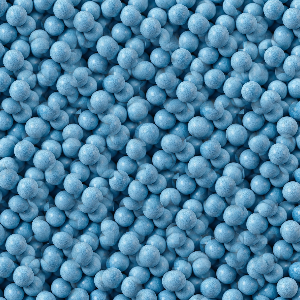

In [ ]:
from google.colab.patches import cv2_imshow
NUM_CANDIDATES = 1600
COHERENCE_CANDIDATES = 15

output = synthesize_texture('texture1.jpg', output_size=2400, patch_size=390, overlap=130, tolerance=0.0000000001)
cv2.imwrite('t1_output3.jpg', output)
display_img = cv2.resize(output, (300, 300))
cv2_imshow(display_img)

Synthesizing texture:   0%|          | 0/361 [00:00<?, ?patch/s]

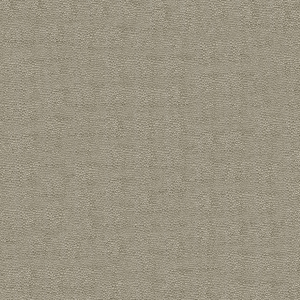

In [ ]:
from google.colab.patches import cv2_imshow
NUM_CANDIDATES = 100
COHERENCE_CANDIDATES = 10

output = synthesize_texture('texture2.jpg', output_size=2400, patch_size=240, overlap=120, tolerance=0.0000000001)
cv2.imwrite('t2_output.jpg', output)
display_img = cv2.resize(output, (300, 300))
cv2_imshow(display_img)

Synthesizing texture:   0%|          | 0/900 [00:00<?, ?patch/s]

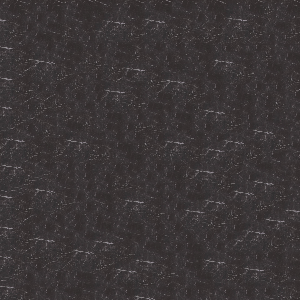

In [ ]:
from google.colab.patches import cv2_imshow
NUM_CANDIDATES = 100
COHERENCE_CANDIDATES = 10

output = synthesize_texture('texture3.jpg', output_size=2400, patch_size=120, overlap=40, tolerance=0.0000000001)
cv2.imwrite('t3_output.jpg', output)
display_img = cv2.resize(output, (300, 300))
cv2_imshow(display_img)

### Method 2: Patch Match

**Patch Match** is a method for image inpainting introduced in the following work:

Website: https://gfx.cs.princeton.edu/pubs/Barnes_2009_PAR/index.php

Paper: https://gfx.cs.princeton.edu/pubs/Barnes_2009_PAR/patchmatch.pdf


Implement the following function to apply patch match on image `A` from image `B`:

In [ ]:
def get_mask(image):

  def dilate_mask(mask, kernel_size=3, iterations=1):
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (kernel_size, kernel_size))
    dilated_mask = cv2.dilate(mask, kernel, iterations=iterations)
    return dilated_mask
  mask = np.all(image == [0, 0, 0], axis=2).astype(np.uint8)
  return dilate_mask(mask, kernel_size=3, iterations=1)

In [ ]:
import numpy as np
import cv2
from tqdm import tqdm

def get_patch(img, x, y, patch_size):
    h, w, _ = img.shape
    x = np.clip(x, 0, w - patch_size)
    y = np.clip(y, 0, h - patch_size)
    return img[y:y+patch_size, x:x+patch_size, :]

def initialize_nnf(target, source, mask, patch_size):
    h, w, _ = target.shape
    nnf = np.zeros((h, w, 2), dtype=np.int32)
    source_h, source_w, _ = source.shape
    valid_mask = mask.astype(bool)
    masked_indices = np.where(valid_mask)
    num_masked = len(masked_indices[0])
    rand_x = np.random.randint(0, source_w - patch_size, num_masked)
    rand_y = np.random.randint(0, source_h - patch_size, num_masked)
    nnf[valid_mask] = np.stack([rand_x, rand_y], axis=-1)

    y, x = np.indices((h, w))
    nnf[~valid_mask] = np.stack([x[~valid_mask], y[~valid_mask]], axis=-1)
    return nnf

def compute_patch_distance(patch_a, patch_b, norm_factor):
    diff = patch_a.astype(np.float32) - patch_b.astype(np.float32)
    return np.sum(diff ** 2) * norm_factor

def propagate_nnf(target, source, nnf, mask, patch_size, is_forward):
    h, w, _ = target.shape
    half = patch_size // 2
    norm_factor = 1.0 / (patch_size * patch_size * target.shape[2])

    x_range = range(half, w - half)
    y_range = range(half, h - half)
    if not is_forward:
        x_range = reversed(x_range)
        y_range = reversed(y_range)

    for y in y_range:
        for x in x_range:
            if not mask[y, x]:
                continue

            best = nnf[y, x]
            target_patch = get_patch(target, x, y, patch_size)
            best_patch = get_patch(source, best[0], best[1], patch_size)
            best_dist = compute_patch_distance(target_patch, best_patch, norm_factor)

            neighbors = []
            if is_forward:
                if x - 1 >= 0:
                    neighbors.append(nnf[y, x - 1])
                if y - 1 >= 0:
                    neighbors.append(nnf[y - 1, x])
            else:
                if x + 1 < w:
                    neighbors.append(nnf[y, x + 1])
                if y + 1 < h:
                    neighbors.append(nnf[y + 1, x])

            for n in neighbors:
                xp, yp = n
                xp = np.clip(xp, 0, source.shape[1] - patch_size)
                yp = np.clip(yp, 0, source.shape[0] - patch_size)
                cand_patch = get_patch(source, xp, yp, patch_size)
                dist = compute_patch_distance(target_patch, cand_patch, norm_factor)
                if dist < best_dist:
                    best = [xp, yp]
                    best_dist = dist

            nnf[y, x] = best

    return nnf

def random_search_nnf(target, source, nnf, mask, patch_size, alpha=0.5, max_radius_factor=0.3):
    h, w, _ = target.shape
    max_radius = int(max(h, w) * max_radius_factor)
    half = patch_size // 2
    norm_factor = 1.0 / (patch_size * patch_size * target.shape[2])

    valid_mask = mask[half:h-half, half:w-half]
    masked_indices = np.where(valid_mask)
    ys = masked_indices[0] + half
    xs = masked_indices[1] + half

    for y, x in zip(ys, xs):
        best = nnf[y, x]
        target_patch = get_patch(target, x, y, patch_size)
        best_patch = get_patch(source, best[0], best[1], patch_size)
        best_dist = compute_patch_distance(target_patch, best_patch, norm_factor)

        radius = max_radius
        while radius >= 1:
            rand_dx = np.random.randint(-radius, radius + 1)
            rand_dy = np.random.randint(-radius, radius + 1)
            rx = best[0] + rand_dx
            ry = best[1] + rand_dy

            if 0 <= rx <= source.shape[1] - patch_size and 0 <= ry <= source.shape[0] - patch_size:
                cand_patch = get_patch(source, rx, ry, patch_size)
                dist = compute_patch_distance(target_patch, cand_patch, norm_factor)
                if dist < best_dist:
                    best = [rx, ry]
                    best_dist = dist
            radius = int(radius * alpha)

        nnf[y, x] = best

    return nnf

def reconstruct_image(target, source, nnf, mask, patch_size):
    h, w, c = target.shape
    half = patch_size // 2
    vote_img = np.zeros_like(target, dtype=np.float32)
    vote_count = np.zeros((h, w), dtype=np.float32)
    valid_mask = mask[half:h-half, half:w-half]
    masked_indices = np.where(valid_mask)
    ys = masked_indices[0] + half
    xs = masked_indices[1] + half

    for y, x in zip(ys, xs):
        src_x, src_y = nnf[y, x]
        src_patch = get_patch(source, src_x, src_y, patch_size)
        vote_img[y, x] += src_patch[half, half]
        vote_count[y, x] += 1

    result = target.copy()
    mask_exp = np.expand_dims(mask, axis=-1)
    where = (vote_count > 0) & mask_exp[:, :, 0]
    if np.any(where):
        result[where] = (vote_img[where] / vote_count[where][:, np.newaxis]).astype(np.uint8)

    return result

def patchmatch_inpaint(target, source, mask, patch_size=7, iterations=10):
    h, w, _ = target.shape

    if len(mask.shape) == 3:
        mask = np.any(mask != 0, axis=-1)
    mask = mask.astype(bool)

    nnf = initialize_nnf(target, source, mask, patch_size)

    for i in tqdm(range(iterations), desc="PatchMatch"):
        nnf = propagate_nnf(target, source, nnf, mask, patch_size, is_forward=True)
        nnf = propagate_nnf(target, source, nnf, mask, patch_size, is_forward=False)
        nnf = random_search_nnf(target, source, nnf, mask, patch_size)

    result = reconstruct_image(target, source, nnf, mask, patch_size)
    return result

PatchMatch: 100%|██████████| 6/6 [03:42<00:00, 37.03s/it]


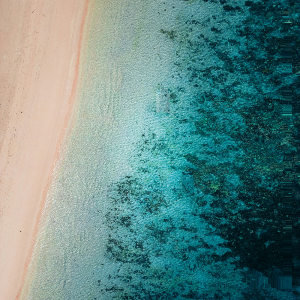

In [ ]:
from google.colab.patches import cv2_imshow
A = cv2.imread('patchmatch-input_edited.jpg')
B = cv2.imread('patchmatch-input.jpg')
a, b = 600, 800
A = cv2.resize(A, (b, a))
B = cv2.resize(B, (b, a))

M = cv2.imread('input-mask.jpg', cv2.COLOR_BGR2RGB)
M = cv2.resize(M, (b, a))
mask = get_mask(M)

patch_size = 45
iterations = 6

result = patchmatch_inpaint(A, B, mask, patch_size, iterations)
cv2.imwrite('patchmatch-output-boat.jpg', result)
result = cv2.resize(result, (300, 300))
cv2_imshow(result)

From `patchmatch-input.jpg`, remove the two boats (you can do it manually) and recover their background using patchmatch. Choose proper parameters to get the best possible result.

## Section 3: Removing Objects and Completing the Image

For the last part, we will use above functions to remove the detected objects from section 1 and complete the initial image.

First, Remove the matched objects from `input.jpg` and plot the result. You may do this by simply setting the intensity of the matched pixels to 0 (or anything else).

Now, apply texture synthesis or patch match (or both) to complete the removed part of the image. Save the result as `output-complete.jpg`. Your score on this part depends on the qulity of the completed parts.

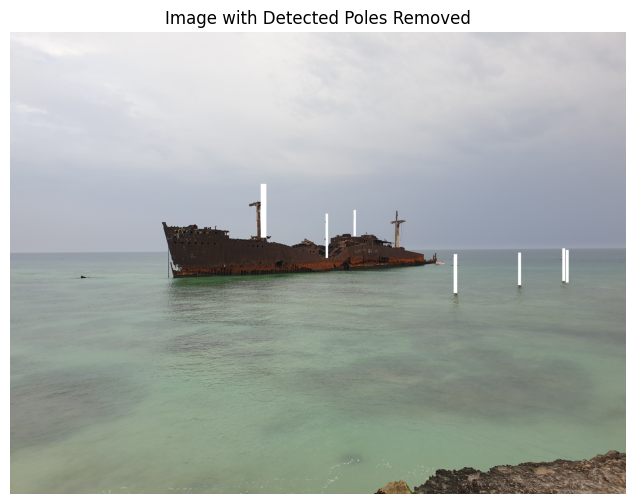

True

In [ ]:
import matplotlib.pyplot as plt

img_removed = img.copy()
img_removed[mask == 255] = [255, 255, 255]

plt.figure(figsize=(8, 6))
plt.imshow(cv2.cvtColor(img_removed, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title("Image with Detected Poles Removed")
plt.show()

cv2.imwrite("removed.jpg", img_removed)


In [ ]:
def replace_with_random_pixels(image, mask):

    if image.dtype != np.uint8:
        image = image.astype(np.uint8)

    mask_copy = mask.copy()
    if len(mask_copy.shape) == 3:
        mask_copy = np.any(mask_copy != 0, axis=-1)
    mask_bool = mask_copy.astype(bool)
    h, w, c = image.shape
    result = image.copy()
    masked_indices = np.where(mask_bool)
    num_masked = len(masked_indices[0])

    if num_masked == 0:
        return result

    y_coords, x_coords = np.indices((h, w))
    valid_pixels = np.stack([y_coords.ravel(), x_coords.ravel()], axis=-1)

    random_indices = np.random.choice(len(valid_pixels), size=num_masked, replace=True)
    random_coords = valid_pixels[random_indices]

    result[masked_indices[0], masked_indices[1]] = image[random_coords[:, 0], random_coords[:, 1]]

    return result

PatchMatch: 100%|██████████| 25/25 [02:29<00:00,  5.97s/it]


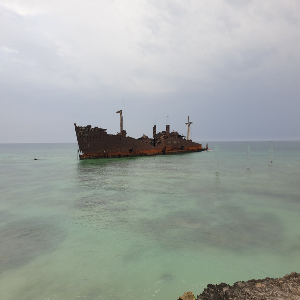

In [ ]:
import cv2
import numpy as np
from tqdm import tqdm
from google.colab.patches import cv2_imshow

A = cv2.imread('input_edited.jpg')
B = cv2.imread('input.jpg')
a, b = 1000, 1400
A = cv2.resize(A, (b, a))
B = cv2.resize(B, (b, a))
mask = cv2.imread('mask.png')
mask = cv2.resize(mask, (b, a))

mask = cv2.dilate(mask.astype(np.uint8), np.ones((10, 10), np.uint8), iterations=1)>0
patch_size = 45
iterations = 25
result = patchmatch_inpaint(A, B, mask, patch_size, iterations)

cv2.imwrite('patchmatch-output1.jpg', result)
result = cv2.resize(result, (300, 300))
cv2_imshow(result)
